<a href="https://colab.research.google.com/github/IlhamFaturachman/pcvk-ganjil-2025/blob/main/week3_pcvk.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Masukkan nilai kecerahan: 100


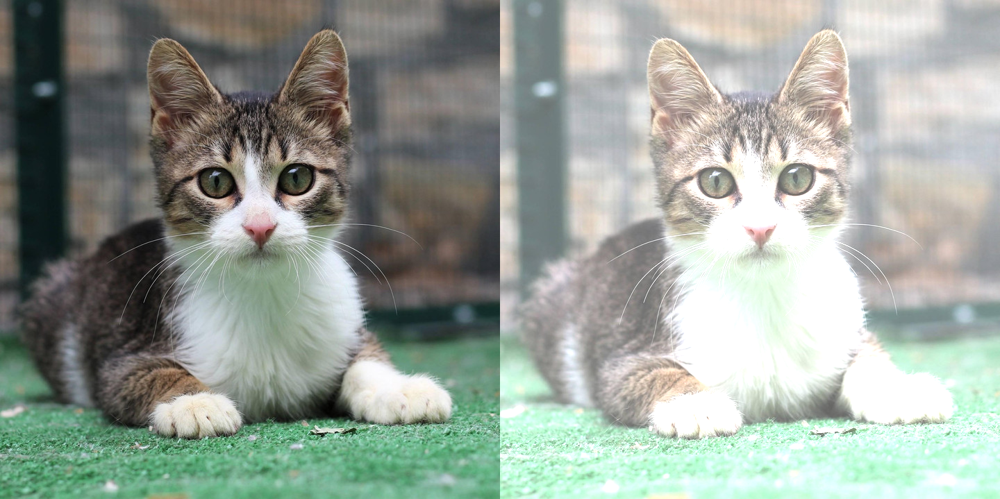

In [7]:
import cv2 as cv
import numpy as np
from google.colab.patches import cv2_imshow

# input
try:
    brightness = int(input('Masukkan nilai kecerahan: '))
except ValueError:
    print('Error, not a number')
    raise SystemExit

original = cv.imread('/content/drive/MyDrive/PCVK/kitten.jpg')
if original is None:
    raise FileNotFoundError('Gambar tidak ditemukan')

# saturating add (tanpa loop, anti-overflow)
brightness_image = cv.convertScaleAbs(original, alpha=1.0, beta=brightness)

final_frame = cv.hconcat((original, brightness_image))
cv2_imshow(final_frame)


## 1. Implement image inverse in your code using formula shown in the theoretical background subsection above, giving the output shown in the following figure:

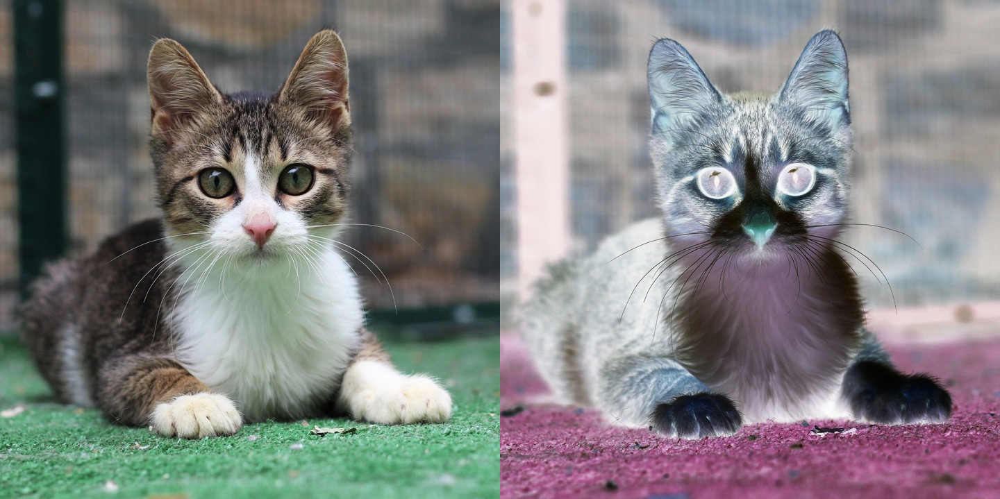

In [8]:
import cv2 as cv
import numpy as np
from google.colab.patches import cv2_imshow

# Baca gambar
img = cv.imread('/content/drive/MyDrive/PCVK/kitten.jpg')
if img is None:
    raise FileNotFoundError('Gambar tidak ditemukan!')

# Inversi citra (formula: 255 - f(x,y))
inverse_img = 255 - img

# Atau bisa juga dengan fungsi OpenCV:
# inverse_img = cv.bitwise_not(img)

# Tampilkan hasil
result = cv.hconcat((img, inverse_img))
cv2_imshow(result)
cv.waitKey(0)
cv.destroyAllWindows()


## 2. Implement contrast transformation in Google Collaboratory using the formula written in the Theoretical background section, giving the output shown in the following figure:

Mengubah kontras dan tingkat kecerahan citra
--------------------------------------------
Masukkan tingkat kecerahan [-255 - 255]: 60
Masukkan kontras [1.0 - 3.0]: 1.5


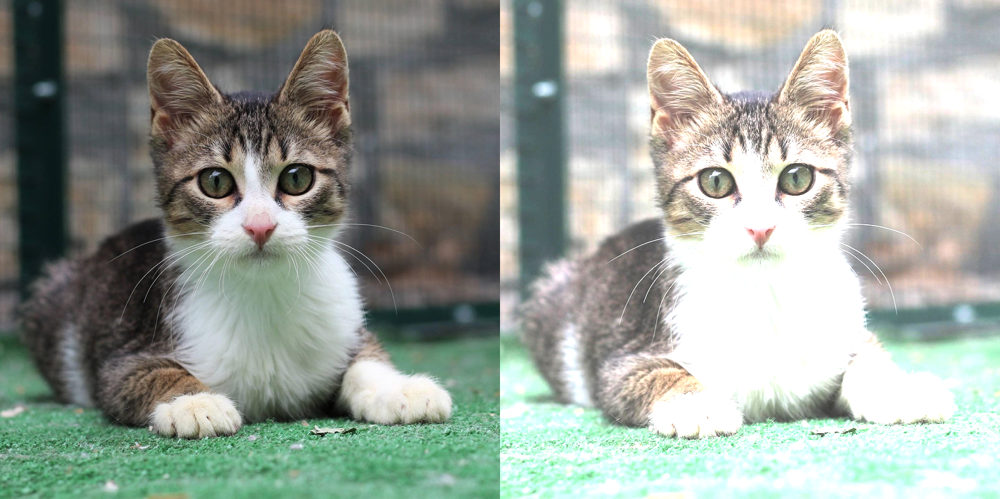

In [9]:
import cv2 as cv
import numpy as np
from google.colab.patches import cv2_imshow

print("Mengubah kontras dan tingkat kecerahan citra")
print("--------------------------------------------")

# Input brightness dan contrast
try:
    brightness = int(input("Masukkan tingkat kecerahan [-255 - 255]: "))
    contrast = float(input("Masukkan kontras [1.0 - 3.0]: "))
except ValueError:
    print("Input tidak valid")
    raise SystemExit

# Baca gambar
img = cv.imread('/content/drive/MyDrive/PCVK/kitten.jpg')
if img is None:
    raise FileNotFoundError("Gambar tidak ditemukan!")

# --- Metode 1: OpenCV langsung (paling mudah, anti overflow)
adjusted = cv.convertScaleAbs(img, alpha=contrast, beta=brightness)

# --- Metode 2 (opsional): manual
# tmp = img.astype(np.float32) * contrast + brightness
# adjusted = np.clip(tmp, 0, 255).astype(np.uint8)

# Gabungkan asli & hasil
result = cv.hconcat((img, adjusted))
cv2_imshow(result)
cv.waitKey(0)
cv.destroyAllWindows()


## 3. Implement transformation of logarithmic brightness on Google Colaboratory using the formula written in the Theoretical Background Reviews, generating output shown in the following figure:

Mengubah tingkat kecerahan citra dengan Transformasi Log
-------------------------------------------------------
Masukkan nilai kecerahan: 40


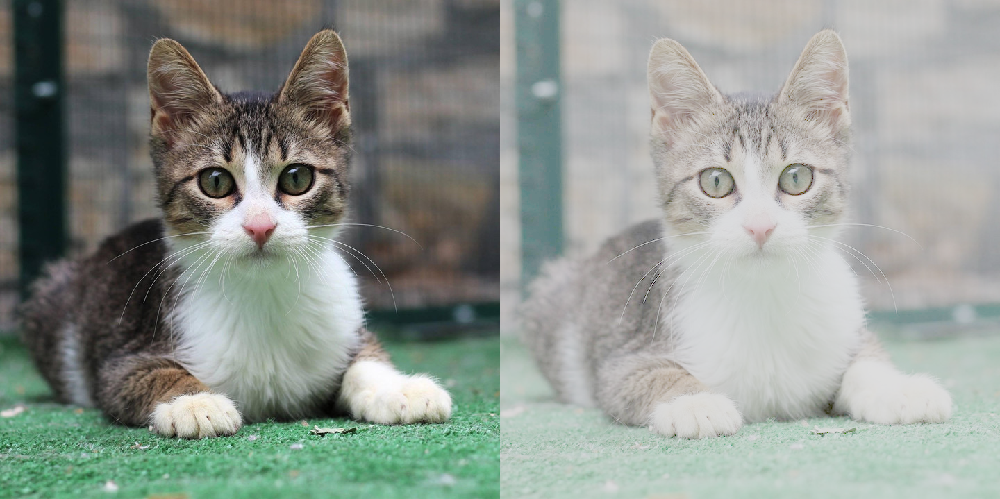

In [10]:
import cv2 as cv
import numpy as np
from google.colab.patches import cv2_imshow

print("Mengubah tingkat kecerahan citra dengan Transformasi Log")
print("-------------------------------------------------------")

# Input konstanta log
try:
    c = float(input("Masukkan nilai kecerahan: "))
except ValueError:
    print("Input tidak valid")
    raise SystemExit

# Baca gambar
img = cv.imread('/content/drive/MyDrive/PCVK/kitten.jpg')
if img is None:
    raise FileNotFoundError("Gambar tidak ditemukan!")

# --- Transformasi Log ---
# 1. Ubah ke float supaya tidak overflow
img_float = img.astype(np.float32)

# 2. Terapkan rumus log
log_img = c * np.log1p(img_float)  # log1p(x) = log(1+x), lebih stabil numeriknya

# 3. Skala ke 0..255 dan ubah kembali ke uint8
log_img = np.clip(log_img, 0, 255).astype(np.uint8)

# Gabungkan citra asli & hasil
result = cv.hconcat((img, log_img))
cv2_imshow(result)
cv.waitKey(0)
cv.destroyAllWindows()


## 4. Implement grayscale transformation using the averaging, lightness, and luminance method on Google Colaboratory using the formula written in the Theoretical Background Reviews, generating output as follows :

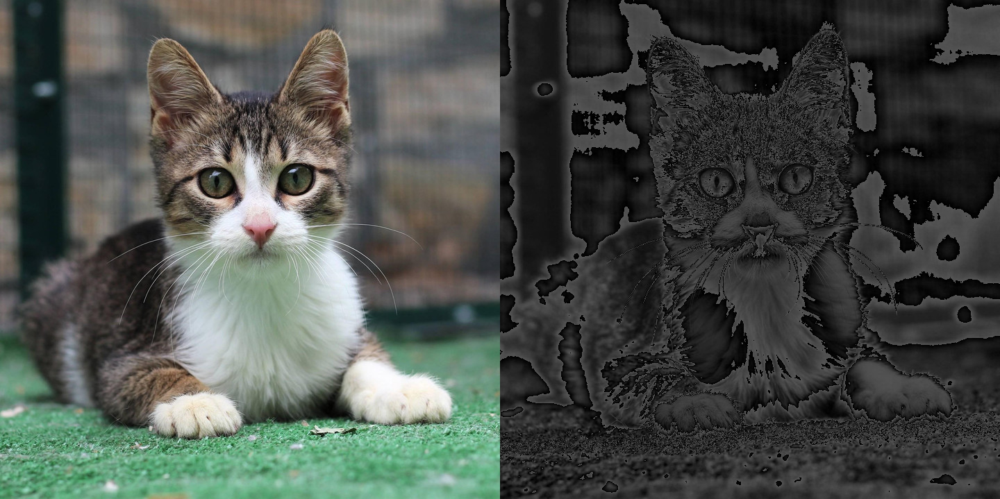

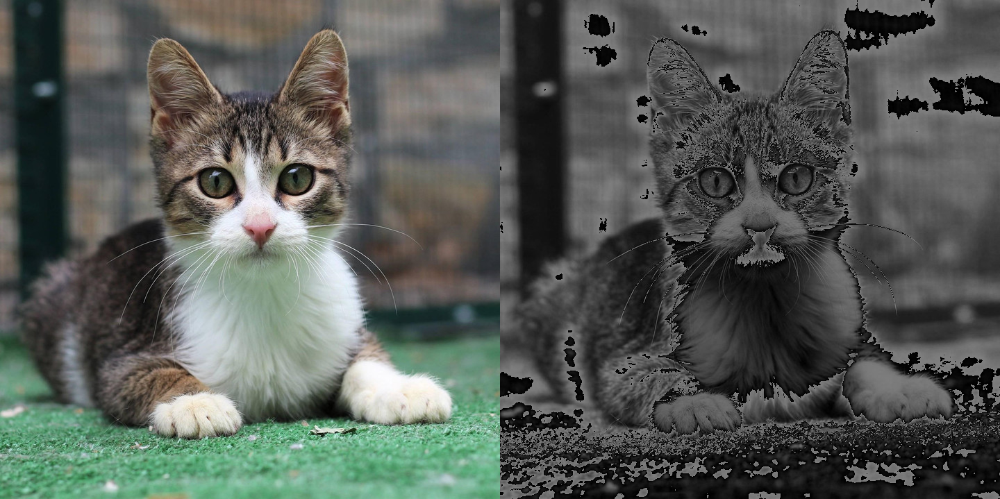

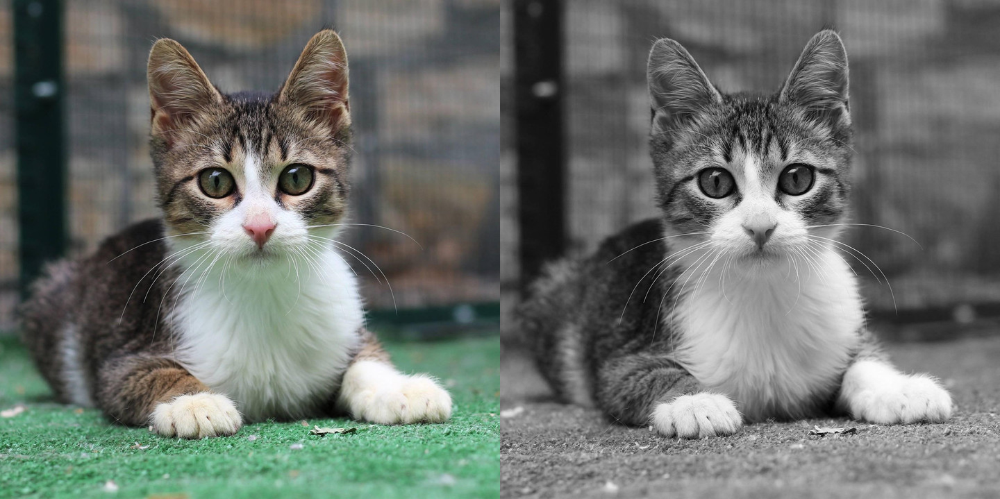

In [11]:
import cv2 as cv
import numpy as np
from google.colab.patches import cv2_imshow

# Baca gambar (gunakan path sesuai lokasi file kamu)
img = cv.imread('/content/drive/MyDrive/PCVK/kitten.jpg')
if img is None:
    raise FileNotFoundError("Gambar tidak ditemukan!")

# Pastikan BGR -> R,G,B
B, G, R = cv.split(img)

# --- 1. Grayscale Averaging ---
gray_avg = ((R + G + B) / 3).astype(np.uint8)

# --- 2. Grayscale Lightness ---
max_val = np.maximum(np.maximum(R, G), B)
min_val = np.minimum(np.minimum(R, G), B)
gray_light = ((max_val + min_val) / 2).astype(np.uint8)

# --- 3. Grayscale Luminance (perceptual) ---
gray_lum = (0.299 * R + 0.587 * G + 0.114 * B).astype(np.uint8)

# Tampilkan hasil berdampingan
cv2_imshow(cv.hconcat([img, cv.merge([gray_avg]*3)]))
cv2_imshow(cv.hconcat([img, cv.merge([gray_light]*3)]))
cv2_imshow(cv.hconcat([img, cv.merge([gray_lum]*3)]))

cv.waitKey(0)
cv.destroyAllWindows()


## 5. Show certain colors in the image , and change other colors to grayscale. For example , show the blue color in the image input and change the parts other which is not colored blue into grayscale as in the example below :

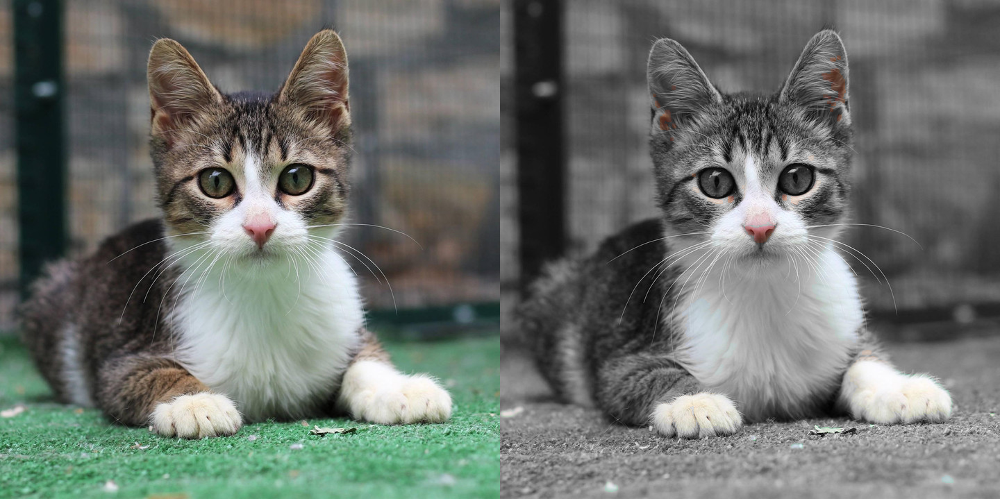

In [12]:
import cv2 as cv
import numpy as np
from google.colab.patches import cv2_imshow

# --- 1) Baca gambar ---
img_path = "/content/drive/MyDrive/PCVK/kitten.jpg"  # ganti sesuai lokasi kamu
img = cv.imread(img_path)
if img is None:
    raise FileNotFoundError("Gambar tidak ditemukan")

# --- 2) Konversi ke HSV ---
hsv = cv.cvtColor(img, cv.COLOR_BGR2HSV)

# --- 3) Mask untuk MERAH (hidung) ---
# rentang merah bawah dan atas (tuning aman, hindari noise)
red_lower1 = np.array([0,   80,  80], dtype=np.uint8)
red_upper1 = np.array([10, 255, 255], dtype=np.uint8)
red_lower2 = np.array([170, 80,  80], dtype=np.uint8)
red_upper2 = np.array([180, 255, 255], dtype=np.uint8)

mask_red = cv.inRange(hsv, red_lower1, red_upper1) | cv.inRange(hsv, red_lower2, red_upper2)

# --- 4) Mask untuk PUTIH (sekitar hidung) ---
# Putih: saturasi kecil, value tinggi
white_lower = np.array([0,   0, 200], dtype=np.uint8)
white_upper = np.array([180, 40, 255], dtype=np.uint8)
mask_white = cv.inRange(hsv, white_lower, white_upper)

# --- 5) Gabungkan mask (merah ∪ putih) ---
mask = cv.bitwise_or(mask_red, mask_white)

# Opsional: rapikan mask dengan morfologi ringan
kernel = np.ones((3,3), np.uint8)
mask = cv.morphologyEx(mask, cv.MORPH_OPEN, kernel, iterations=1)
mask = cv.morphologyEx(mask, cv.MORPH_DILATE, kernel, iterations=1)

# --- 6) Buat versi grayscale dan campur ---
gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)
gray3 = cv.cvtColor(gray, cv.COLOR_GRAY2BGR)

# Tempel warna hanya pada area mask, sisanya grayscale
result = np.where(mask[..., None] == 255, img, gray3)

# --- 7) Tampilkan ---
show = cv.hconcat([img, result])
cv2_imshow(show)
